In [3]:
!pip3 uninstall -y opencv-contrib-python 
!pip3 uninstall -y opencv-python

!pip3 install opencv-contrib-python
!pip3 install opencv-python

Found existing installation: opencv-contrib-python 4.7.0.72
Uninstalling opencv-contrib-python-4.7.0.72:
  Successfully uninstalled opencv-contrib-python-4.7.0.72
Found existing installation: opencv-python 4.7.0.72
Uninstalling opencv-python-4.7.0.72:
  Successfully uninstalled opencv-python-4.7.0.72
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.9/67.9 MB 13.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.8/61.8 MB 13.9 MB/s eta 0:00:00


# Computer Vision - Lab 2 

In [4]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import math
import matplotlib.image as mpimg

In [5]:
def matching(img, img_part, match_number=300):
  sift = cv.SIFT_create() 
  # find the keypoints and descriptors with SIFT 
  kp1, des1 = sift.detectAndCompute(img_part,None) 
  kp2, des2 = sift.detectAndCompute(img,None) 

  #Own Matcher 
  matchings = []
  for index1, desc1 in enumerate(des1):
    distances = []
    for index2, desc2 in enumerate(des2):
      dist_l2 = np.sqrt(np.sum(np.power((desc1-desc2),2)))
      distances.append(dist_l2)
    min_distance = min(distances)
    tr_ind = distances.index(min_distance)
    matchings.append(cv.DMatch(_distance=min_distance, _imgIdx=0, _queryIdx=index1,_trainIdx=tr_ind))
  matchings_sorted = sorted(matchings, key = lambda x:x.distance) 

  img_final =  cv.drawMatches(img_part,kp1,img,kp2,matchings_sorted[:match_number],None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS) 
  plt.figure(figsize=(10,10))
  plt.imshow(img_final)
  plt.show() 

In [33]:
def matching_opencv(img, img_part, match_number=300):
  sift = cv.SIFT_create() 
  # find the keypoints and descriptors with SIFT 
  kp1, des1 = sift.detectAndCompute(img_part,None) 
  kp2, des2 = sift.detectAndCompute(img,None) 
  # BFMatcher 
  bf = cv.BFMatcher() 
  matches = bf.match(des1,des2) 
  matches = sorted(matches, key = lambda x:x.distance) 

  img_final =  cv.drawMatches(img_part,kp1,img,kp2,matches[:match_number],None,flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS) 
  plt.figure(figsize=(10,10))
  plt.imshow(img_final)
  plt.show() 


## Experiment №1

In [34]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


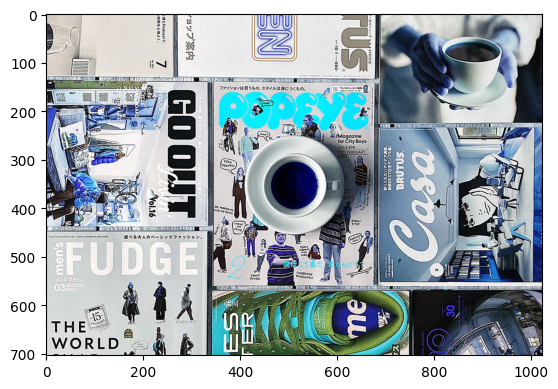

In [35]:
img1 = cv.imread('/high_light.png')
plt.imshow(img1)
plt.show()

# Новый раздел

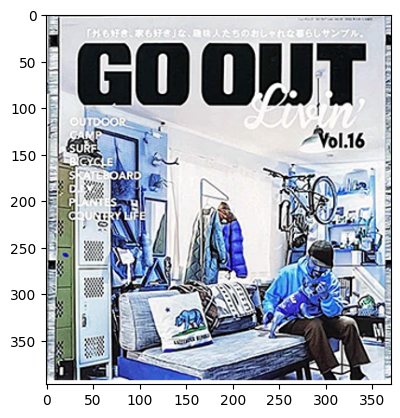

In [36]:
img1_part = cv.imread('/high_light_part.png')
plt.imshow(img1_part)
plt.show()

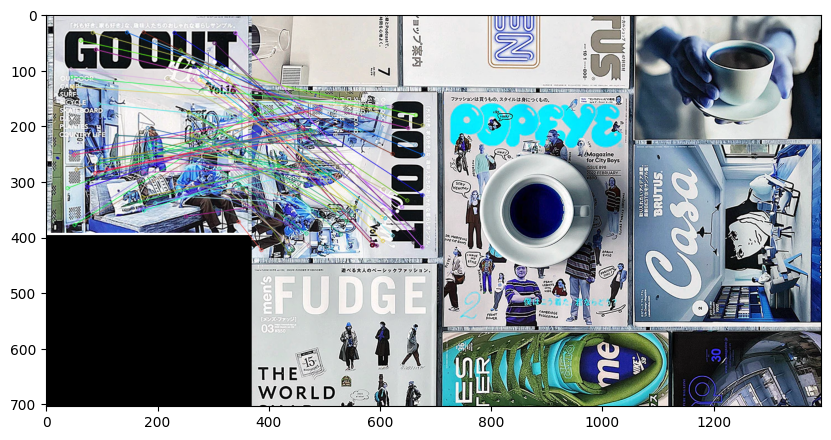

In [37]:
matching_opencv(img1, img1_part,100)

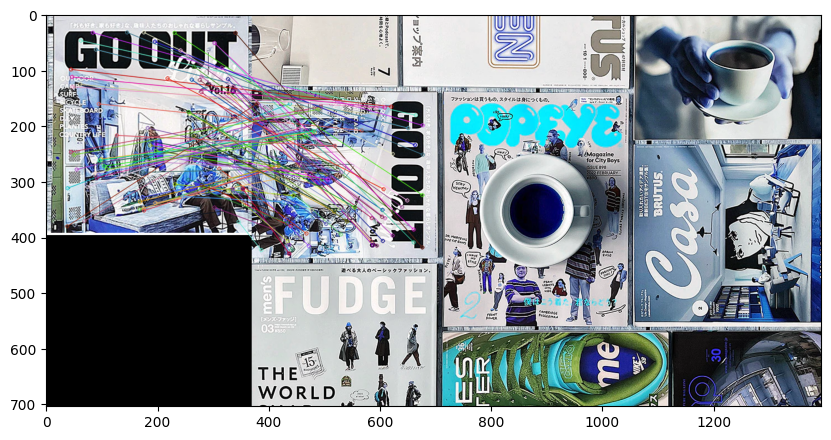

In [39]:
matching(img1, img1_part,100)

## Experimet №2

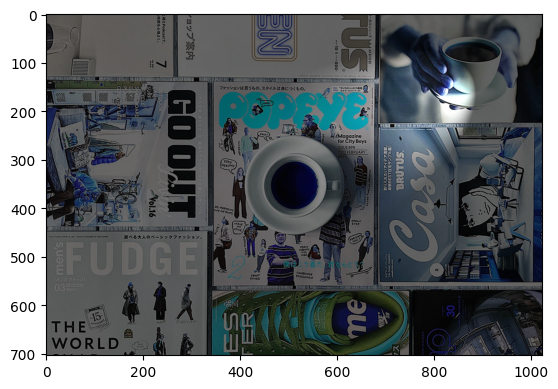

In [40]:
img2 = cv.imread('/low_light.png')
plt.imshow(img2)
plt.show()

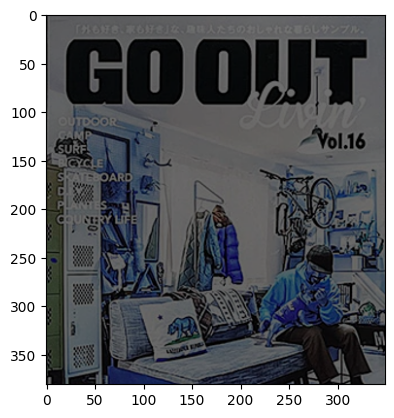

In [41]:
img2_part = cv.imread('/low_light_part.png')
plt.imshow(img2_part)
plt.show()

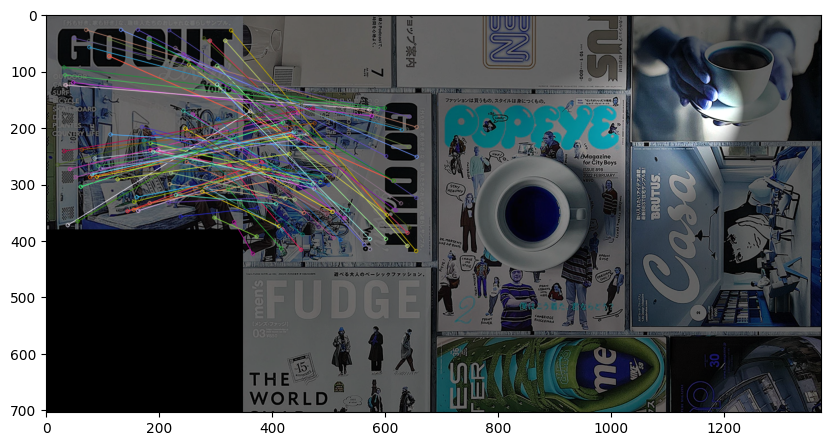

In [42]:
matching_opencv(img2, img2_part,100)

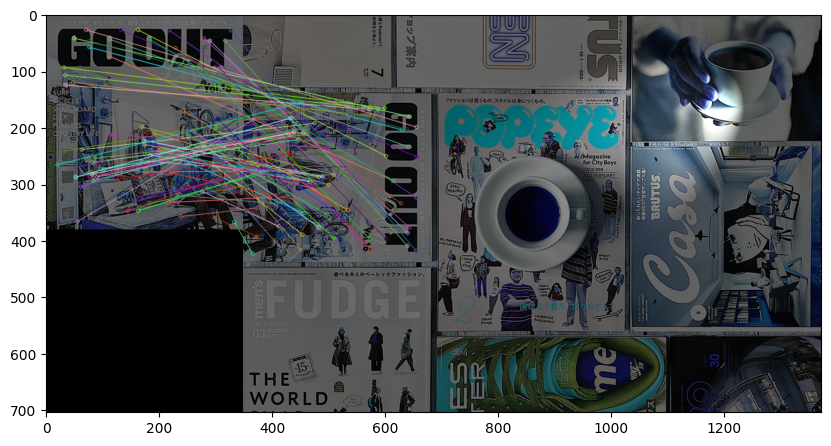

In [43]:
matching(img2, img2_part,100)

## Experiment № 3

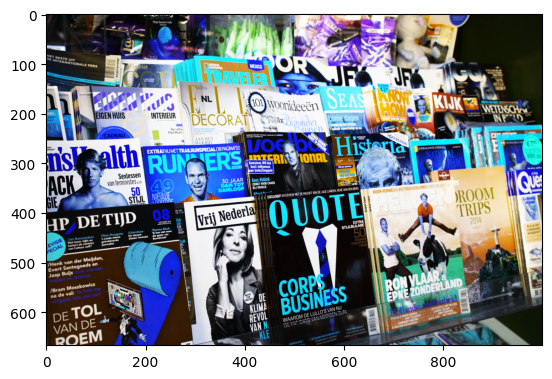

In [44]:
img3 = cv.imread('/high_cont.png')
plt.imshow(img3)
plt.show()

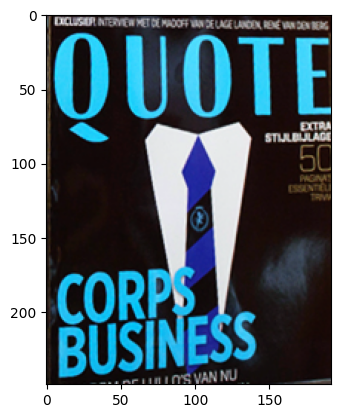

In [45]:
img3_part = cv.imread('/high_cont_part_2.png')
plt.imshow(img3_part)
plt.show()

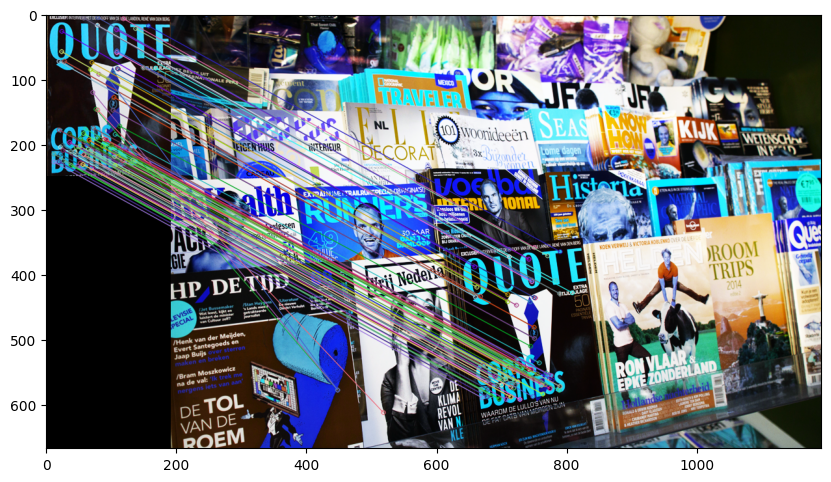

In [46]:
matching_opencv(img3, img3_part,100)

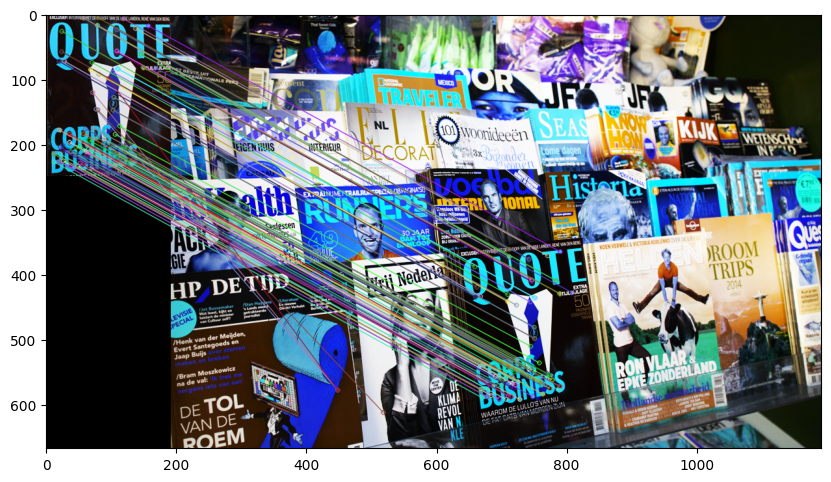

In [47]:
matching(img3, img3_part,100)

## Experiment №4

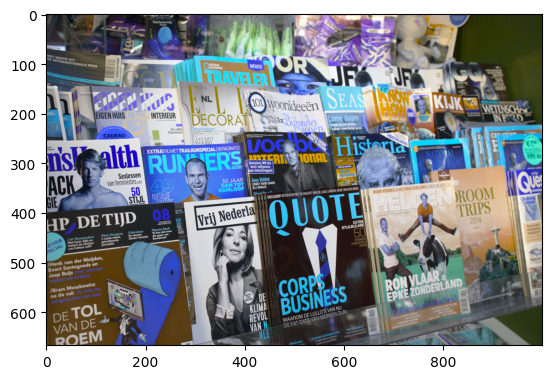

In [48]:
img4 = cv.imread('/low_cont.png')
plt.imshow(img4)
plt.show()

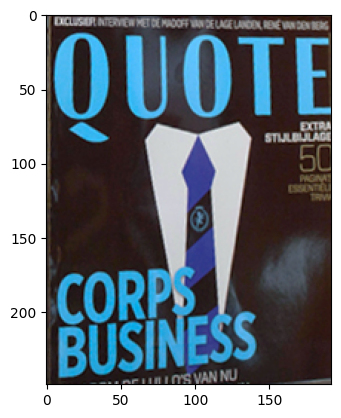

In [49]:
img4_part = cv.imread('/low_cont_part_2.png')
plt.imshow(img4_part)
plt.show()

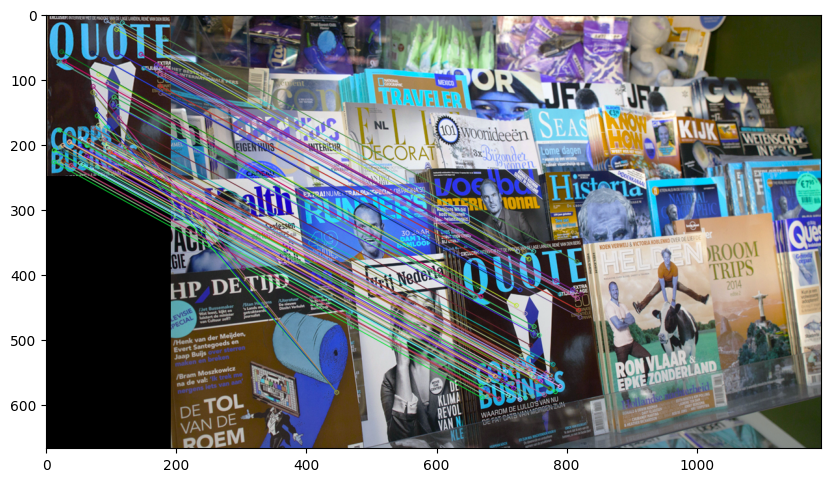

In [50]:
matching_opencv(img4, img4_part,100)

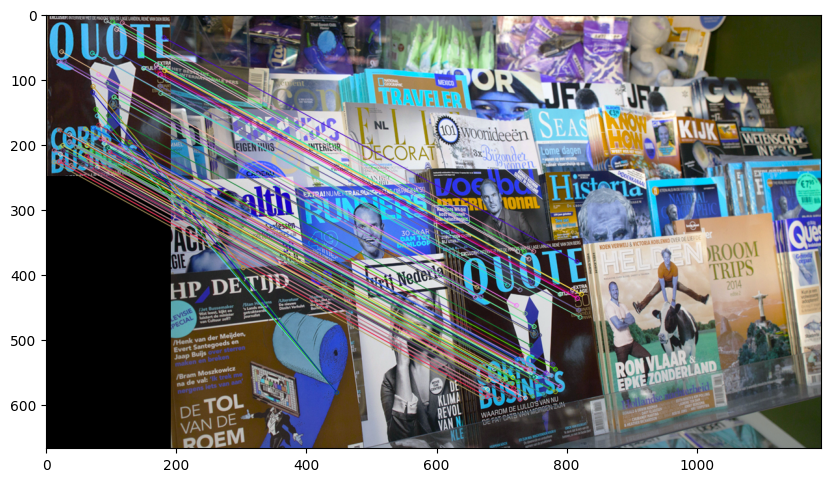

In [51]:
matching(img4, img4_part,100)